# Title: MACHING LEARNING FOR PREDICTING HOUSE PRICES

The King County Housing Authority (KCHA) provides rental housing and rental assistance to more than 18,000 low and moderate income individuals and families throughout the county. KCHA transforms distressed communities through well-designed, higher density, mixed-income housing that utilize energy and water saving technologies.

<br>
<br>
<center><img src="Images/house2.jpg"  width="500" height = "150"></center>

<br>
<br>

## Introduction:

The United Nations Sustainable Development Goals includes a target for making cities and human
settlements inclusive, safe, resilient, and sustainable (Goal 11). A key outcome of this goal is to
provide opportunities for safe and affordable housing. The housing situation in Ghana is far from
the SDG target described above. As a result, it would be interesting to investigate the housing
situation in Ghana and provide an understanding of the housing situation. The goal of this project
therefore, is to use such an understanding to provide a description of places in the country that
provide the best options for budget accommodation.

## Project Description 
In this project, analysis is conducted on a dataset containing housing details from the King County, USA, the region where the city of Seattle is located. This is an end to end machine learning project which includes EDA and Predictive modelling using the various forms of regression. Linear Regeression, Lasso Regression and Ridge Regression




## Dataset Description:
The dataset used in this project was obtained from [source1](https://www.kaggle.com/harlfoxem/housesalesprediction?)<br>
The dataset contains information about the aprtments foor rent in the Greater Accra and Greater Kumasi environs. <br>
The dataset contains 21 features and  21613 observations. The features include,
* price
* bedrooms
* bathrooms
* condition
* sqft_above

## Goal:

The analysis seeks to find;

* Explore the dataset
* Correlation analysis
* Outlier analysis
* Predict housing prices using machine learning



# Importation of libraries

In [1]:
#IMPORTATION OF LIBRARIES
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn.metrics as metrics
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression as lr
from sklearn.preprocessing import OneHotEncoder as ohe
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeRegressor as dt
from sklearn.ensemble import RandomForestRegressor as rf
import pandas_profiling
%matplotlib inline

In [4]:
data=pd.read_csv('dataset/home_data.csv')


# Exploring the data
The dataset contains
* 21 features
* 21613 observations

In [3]:
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


## Summary statistics
### Key observations
1. Most of the columns have the mean being greater than the median (50%) mark <br>
2. Observation one implies the distribution of data in most of the columns is skewed to the right
3. There may exist outliers to the right
The table shows the summary statistics of the housing dataset

In [4]:
#Stat_Train_Riders = Combine_Train_Riders.describe(include='all')
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
id,21613.0,4.580302e+09,2.876566e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21613.0,5.400881e+05,3.671272e+05,7.500000e+04,3.219500e+05,4.500000e+05,6.450000e+05,7.700000e+06
bedrooms,21613.0,3.370842e+00,9.300618e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
bathrooms,21613.0,2.114757e+00,7.701632e-01,0.000000e+00,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
sqft_living,21613.0,2.079900e+03,9.184409e+02,2.900000e+02,1.427000e+03,1.910000e+03,2.550000e+03,1.354000e+04
sqft_lot,21613.0,1.510697e+04,4.142051e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068800e+04,1.651359e+06
floors,21613.0,1.494309e+00,5.399889e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
waterfront,21613.0,7.541757e-03,8.651720e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
view,21613.0,2.343034e-01,7.663176e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21613.0,3.409430e+00,6.507430e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


### Accounting for missing values and data types
The dataset has no missing values. <br>
The dataset contains 4, 16 and 1 column of type float, int(64) and object respectively.

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  int64  
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

### SIze and Dimension
* The dataset contains 21613 observations/rows
* The number of features/columns is 21 

In [6]:
print('Number of rows:',data.shape[0],'\nNumber of columns:',data.shape[1],'\n\nColumns\n',data.columns)


Number of rows: 21613 
Number of columns: 21 

Columns
 Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')


## Plotting of histograms

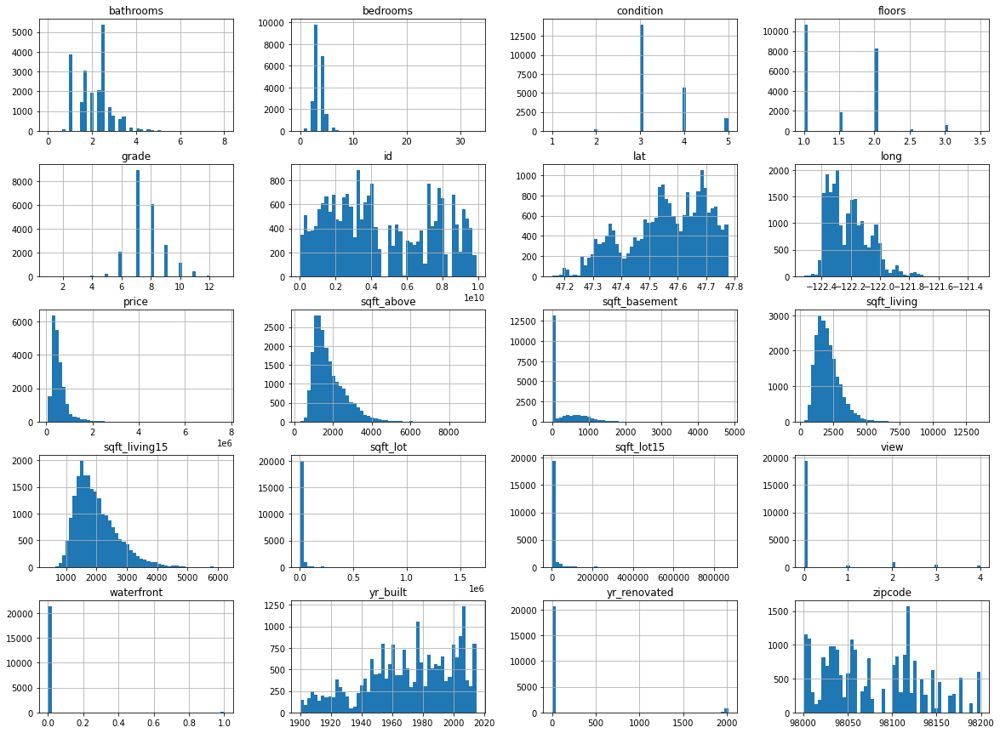

In [7]:
data.hist(bins=50,figsize=(20,15))
plt.show()

## Price Distribution
The price is normally distributed but heavily skewed to the right. This can be the cause of some otliers 
in the dataset.

In [8]:
import plotly.express as px
#df = px.data.tips()
fig = px.histogram(data, x="price")#,nbins=300
fig.show()

### Box plot
This plot clearly shows the outliers in the price data
* On of the house has as alarge as 33 bathrooms, which appears to be an extreme point
* There exist a house with 0 bedroom and 0 bathroom 

In [9]:
plt.figure(figsize=(12,8))
fig = px.box(data, x=['bedrooms','bathrooms','floors'],notched=True)
fig.show()

<Figure size 864x576 with 0 Axes>

In [10]:
data.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [11]:
#df = px.data.tips()
fig = px.box(data, ["sqft_above","sqft_living"])
fig.show();

In [12]:
data['bedrooms'].unique()
#data.columns

array([ 3,  2,  4,  5,  1,  6,  7,  0,  8,  9, 11, 10, 33], dtype=int64)

## Correlation Analysis
It can be observed the correlation between price and <br>
* bathrooms is 0.525
* sqft_living is 0.7
* sqft_above is 0.6
* sqft_living is 0.585

In [13]:
corr_matrix=data.corr()
corr_matrix

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
id,1.000000,-0.016762,0.001286,0.005160,-0.012258,-0.132109,0.018525,-0.002721,0.011592,-0.023783,0.008130,-0.010842,-0.005151,0.021380,-0.016907,-0.008224,-0.001891,0.020799,-0.002901,-0.138798
price,-0.016762,1.000000,0.308350,0.525138,0.702035,0.089661,0.256794,0.266369,0.397293,0.036362,0.667434,0.605567,0.323816,0.054012,0.126434,-0.053203,0.307003,0.021626,0.585379,0.082447
bedrooms,0.001286,0.308350,1.000000,0.515884,0.576671,0.031703,0.175429,-0.006582,0.079532,0.028472,0.356967,0.477600,0.303093,0.154178,0.018841,-0.152668,-0.008931,0.129473,0.391638,0.029244
bathrooms,0.005160,0.525138,0.515884,1.000000,0.754665,0.087740,0.500653,0.063744,0.187737,-0.124982,0.664983,0.685342,0.283770,0.506019,0.050739,-0.203866,0.024573,0.223042,0.568634,0.087175
sqft_living,-0.012258,0.702035,0.576671,0.754665,1.000000,0.172826,0.353949,0.103818,0.284611,-0.058753,0.762704,0.876597,0.435043,0.318049,0.055363,-0.199430,0.052529,0.240223,0.756420,0.183286
sqft_lot,-0.132109,0.089661,0.031703,0.087740,0.172826,1.000000,-0.005201,0.021604,0.074710,-0.008958,0.113621,0.183512,0.015286,0.053080,0.007644,-0.129574,-0.085683,0.229521,0.144608,0.718557
floors,0.018525,0.256794,0.175429,0.500653,0.353949,-0.005201,1.000000,0.023698,0.029444,-0.263768,0.458183,0.523885,-0.245705,0.489319,0.006338,-0.059121,0.049614,0.125419,0.279885,-0.011269
waterfront,-0.002721,0.266369,-0.006582,0.063744,0.103818,0.021604,0.023698,1.000000,0.401857,0.016653,0.082775,0.072075,0.080588,-0.026161,0.092885,0.030285,-0.014274,-0.041910,0.086463,0.030703
view,0.011592,0.397293,0.079532,0.187737,0.284611,0.074710,0.029444,0.401857,1.000000,0.045990,0.251321,0.167649,0.276947,-0.053440,0.103917,0.084827,0.006157,-0.078400,0.280439,0.072575
condition,-0.023783,0.036362,0.028472,-0.124982,-0.058753,-0.008958,-0.263768,0.016653,0.045990,1.000000,-0.144674,-0.158214,0.174105,-0.361417,-0.060618,0.003026,-0.014941,-0.106500,-0.092824,-0.003406


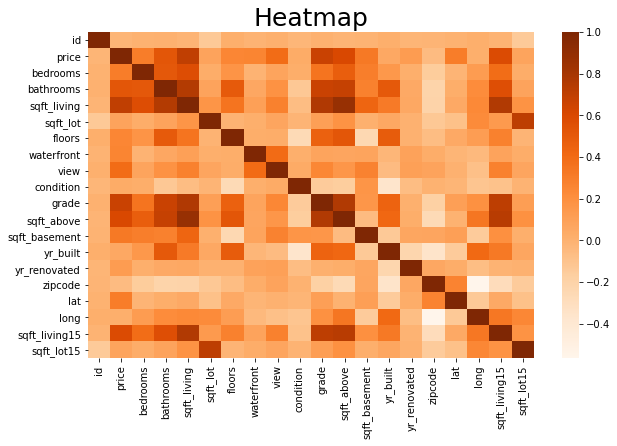

In [14]:
plt.figure(figsize=(10,6))
sns.heatmap(corr_matrix,cmap='Oranges',annot=False) 
plt.title('Heatmap', fontsize=25);

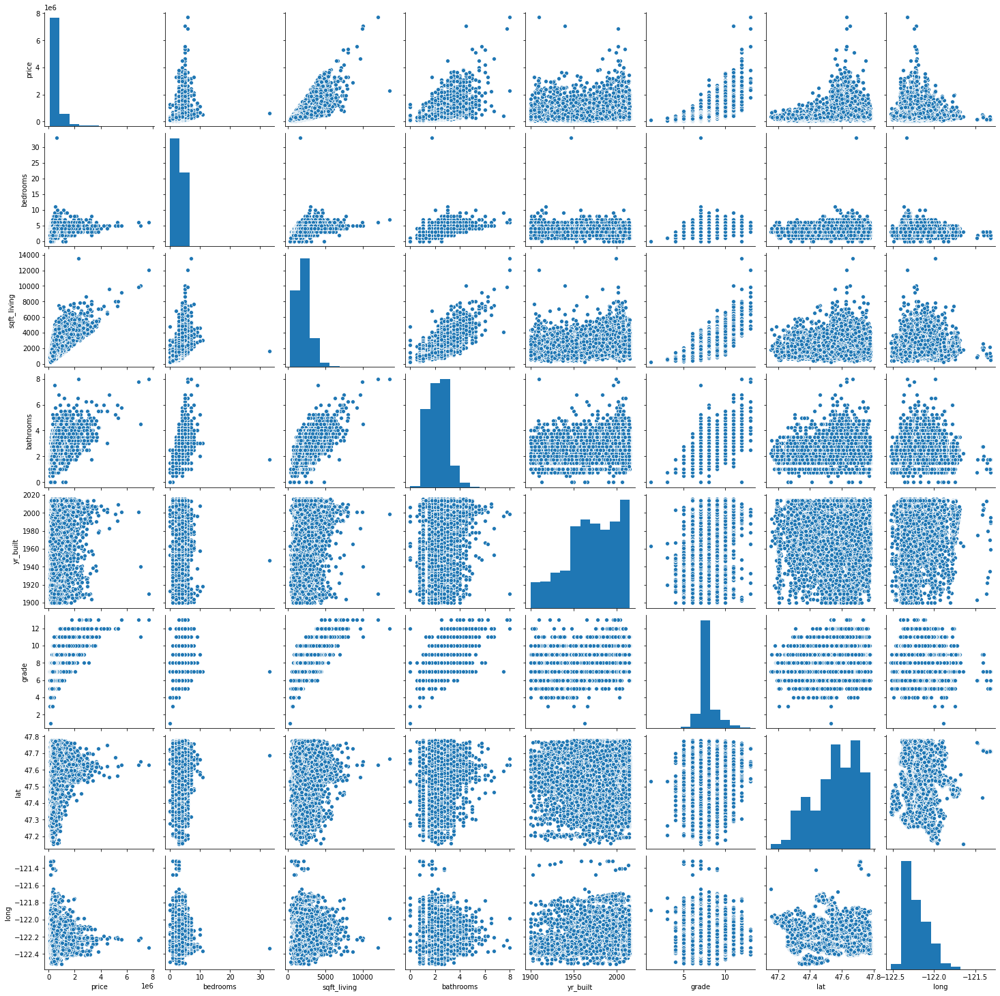

In [7]:
df_sub = data[['price', 'bedrooms', 'sqft_living', 'bathrooms', 'yr_built', 'grade', 'lat', 'long']]
sns.pairplot(df_sub);

In [15]:
# # Get number of unique entries in each column with categorical data
# object_nunique = list(map(lambda col: X_train[col].nunique(), object_cols))
# d = dict(zip(object_cols, object_nunique))

# # Print number of unique entries by column, in ascending order
# sorted(d.items(), key=lambda x: x[1])

In [16]:
data[['price','bathrooms','sqft_above','sqft_living']].corr()

,price,bathrooms,sqft_above,sqft_living
price,1.000000,0.525138,0.605567,0.702035
bathrooms,0.525138,1.000000,0.685342,0.754665
sqft_above,0.605567,0.685342,1.000000,0.876597
sqft_living,0.702035,0.754665,0.876597,1.000000


# Regression Analysis
The regression analysis for the following pairs are conducted
* Price vrs Bathroom
* Price vrs sqft_above
* Price vrs sqft_living


Text(0, 0.5, 'Price')

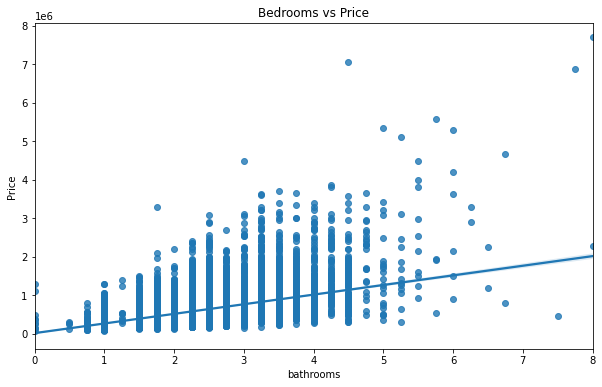

In [17]:
# Price vrs bathroom
plt.figure(figsize=(10,6))
sns.regplot(x = 'bathrooms', y = 'price', data = data)
plt.title("Bedrooms vs Price")
plt.ylabel("Price")

Text(0, 0.5, 'Price')

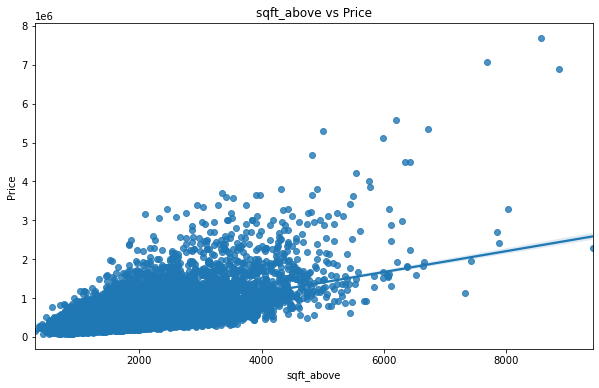

In [18]:
# Price vrs sqft_above
plt.figure(figsize=(10,6))
sns.regplot(x = 'sqft_above', y = 'price', data = data)
plt.title("sqft_above vs Price")
plt.ylabel("Price")

Text(0, 0.5, 'Price')

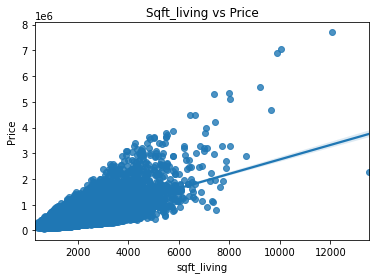

In [19]:
#Price vrs sqft_living
# Price vrs bathroom
sns.regplot(x = 'sqft_living', y = 'price', data = data)
plt.title("Sqft_living vs Price")
plt.ylabel("Price")

## Geographic Location

In [20]:
#df = px.data.tips()
plt.figure(figsize=(8,6))
#plt.title('Location of houses using latitude and longitutde')
fig = px.scatter(data, x='lat',y='long')
#plt.title('Location of houses using latitude and longitutde')
fig.show();

<Figure size 576x432 with 0 Axes>

# MACHINE LEARNING

In [21]:
data.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [22]:
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


## Wrangling Feature Selection
The dataset conatins only numeric variables hence there isn't the need to encode.<br>
Standard scale the features <br>
The number of bathrooms contained floating point numbers.
Hence the need to convert the number of bathrooms to integers

In [23]:
bath=[int(i) for i in data['bathrooms']]
data['bathrooms']=bath

y = data['price']
X = data[['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'zipcode','condition','grade','waterfront','view',
          'sqft_above','sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long', 'sqft_living15', 'sqft_lot15']]

#SPLITTING THE TRAIN TEST SET
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [24]:
X_test.shape

(4323, 18)

# Model Selection, fitting and validation

### Linear Regression without scaling and tranforming

In [25]:
#LINEAR REGRESSION

reg1=lr().fit(X_train,y_train)
predicted_y=reg1.predict(X_test)

mse=metrics.mean_squared_error(y_test,predicted_y)
rmse=np.sqrt(mse)

print('ROOT MEAN SQUARE ERROR: = ',rmse)


ROOT MEAN SQUARE ERROR: =  189978.0071763211


## Ridge regression

In [26]:
ridge = Ridge(alpha=0.1)
ridge.fit(X_train, y_train) 
ridge_predicted_y= ridge.predict(X_test)

print('RMSE:\t',np.sqrt(mean_squared_error(y_test,ridge_predicted_y)))
print('MSE:\t', mean_squared_error(y_test,ridge_predicted_y))
print("R2: \t", r2_score(y_test, ridge_predicted_y))

NameError: name 'Ridge' is not defined

## Lasso Regression

In [ ]:
Lasso = Ridge(alpha=0.01)
Lasso.fit(X_train, y_train) 
lasso_predicted_y= ridge.predict(X_test)

print('RMSE:\t',np.sqrt(mean_squared_error(y_test,lasso_predicted_y)))
print('MSE:\t', mean_squared_error(y_test,lasso_predicted_y))
print("R2: \t", r2_score(y_test, lasso_predicted_y))

## Decision Tree

In [ ]:
#TRYING DECISION TREE ALGORITHM

t_reg = dt(random_state=2,max_leaf_nodes=5).fit(X_train,y_train)
pred_y=t_reg.predict(X_test)

print('RMSE:\t',np.sqrt(mean_squared_error(y_test,pred_y)))
print('MSE:\t', mean_squared_error(y_test,pred_y))
print("R2: \t", r2_score(y_test, pred_y))

## Random Forest

In [ ]:
#Random Forest
rf_reg = rf(random_state=2,max_leaf_nodes=50).fit(X_train,y_train)
forest_pred_y=t_reg.predict(X_test)

print('RMSE:\t',np.sqrt(mean_squared_error(y_test,forest_pred_y)))
print('MSE:\t', mean_squared_error(y_test,forest_pred_y))
print("R2: \t", r2_score(y_test, forest_pred_y))

## XGBoost

In [ ]:
#pip install xgboost

In [27]:
from xgboost import XGBRegressor

xg = XGBRegressor()
xg.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

### Standard Scaler

### Using Variance inflation factor

In [ ]:
prep_X_train=VIF(X_train)

In [ ]:
prep_X_test=VIF(X_test)

### Normalizing / PCA  Dataset

* We can see that our numerical features are on different scales so we need to normalize the data. This way features are now more consistent with each other.
* Outliers from the data set will be lost when we normalize the data.

In [ ]:
print(len(prep_X_train))
print(len(prep_X_test))

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# This does the same thing as the following code (data - data.mean()) / data.std()
sc = StandardScaler()

X_train = sc.fit_transform(prep_X_train)
#Y_train = sc.fit_transform(Y_Train)

X_test = sc.transform(prep_X_test)
#Y_test =sc.transform(Y_Test)

In [ ]:
# Applying PCA
  
pca = PCA()
  
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)
  

In [ ]:
#import sys
#from math import sqrt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
#from sklearn.model_selection import GridSearchCV, train_test_split

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

In [ ]:
w=pd.DataFrame(X_train)
max(w)

In [ ]:
len(X_test)

## Linear Regression

In [ ]:
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)
reg_predicted_y = lin_reg.predict(X_test)

print('RMSE:\t',np.sqrt(mean_squared_error(y_test,reg_predicted_y)))
print('MSE:\t', mean_squared_error(y_test,reg_predicted_y))
print("R2: \t", r2_score(y_test, reg_predicted_y))

In [ ]:
mse=metrics.mean_squared_error(y_test_ad,predicted_y)
rmse=np.sqrt(mse)

print('ROOT MEAN SQUARE ERROR:  ',rmse)

In [ ]:
my_features = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'zipcode']
advanced = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'zipcode','condition','grade','waterfront',
            'view','sqft_above','sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long', 'sqft_living15', 'sqft_lot15']
X1=data[advanced]
X2=data[my_features]
y=data['price']

In [ ]:
#data.columns
data.groupby(data['price']).mean().sort_values('price', ascending=False)

In [ ]:
data['price'].mean()

In [ ]:
sq_feet=data[(data['sqft_living']>=2000) & (data['sqft_living']<=4000)]
sq_feet.shape

In [ ]:
(sq_feet.shape[0]/data.shape[0])

In [ ]:
X_train_ad, X_test_ad, y_train_ad, y_test_ad = train_test_split(X1, y, test_size=0.2, random_state=0)
X_train, X_test, y_train, y_test = train_test_split(X2, y, test_size=0.2, random_state=0)

In [ ]:
reg=lr().fit(X_train_ad,y_train_ad)
predicted_y=reg.predict(X_test_ad)
